# Wikidata 介紹 

常用的 Python 工具

Slides: https://github.com/OsmHackTW/Sinica-intern-2024/blob/main/Wikidata%20and%20Python%202024-Academic-Sinica.ipynb
<div style="text-align: right;">Wikidata 台灣 - 陳瑞霖</div>

# Wikidata 上的 OpenStreetMap 資料
* 推廣 Wikidata，可以介接 OpenStreetMap
* 介紹 Wikidata Query Service
* 也可以用 Python 來截取資料


In [ ]:
#Districts in Taipei
##    wdt:P131 ?place.
##  OPTIONAL {?place wdt:P17 wd:Q865. }
#  OPTIONAL { ?item wdt:P1191 ?date. }
#  OPTIONAL {
#    ?item skos:altLabel ?altLabel.
#    FILTER((LANG(?altLabel)) = "zh-tw")
#  }
SELECT ?item ?ref ?itemLabel ?desc ?altLabel ?coord ?osm ?osmobject WHERE {
  ?item wdt:P31 wd:Q705296;
    (wdt:P131+) wd:Q1867.
  OPTIONAL { ?item wdt:P7121 ?ref. }
  OPTIONAL {
    ?item schema:description ?desc.
    FILTER((LANG(?desc)) = "zh-tw")
  }
  OPTIONAL { ?item wdt:P625 ?coord. }
  OPTIONAL { ?item wdt:P402 ?osm. }
  OPTIONAL { ?item wdt:P10689 ?osmobject. }
  OPTIONAL {
    ?item skos:altLabel ?altLabel.
    FILTER((LANG(?altLabel)) = "zh-tw")
  }
  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],zh-tw,zh-hant,zh". }
}
ORDER BY (?item)

# https://w.wiki/EAWD

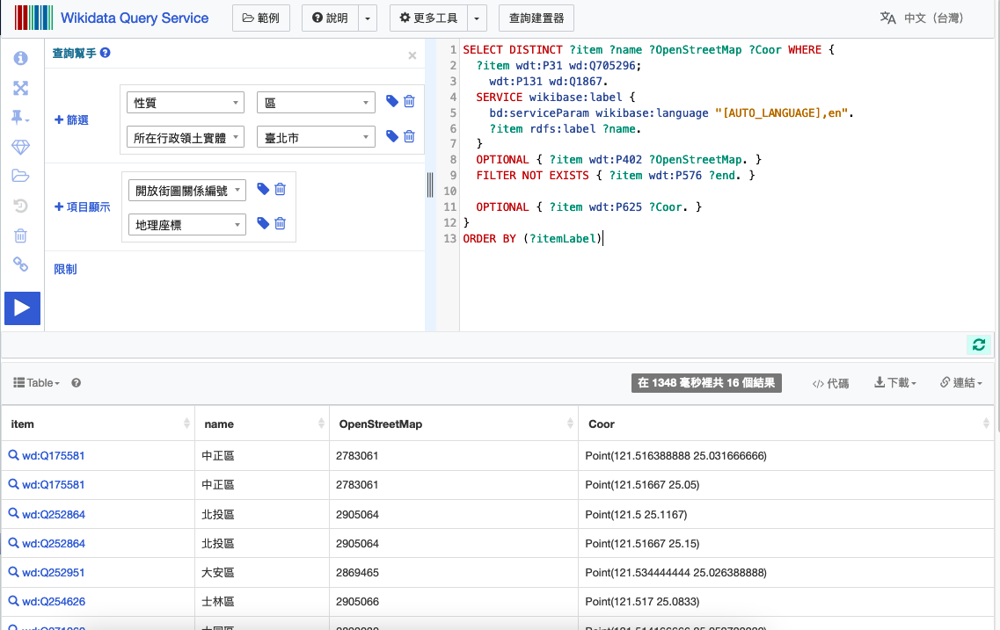

In [ ]:
SELECT ?item ?ref ?itemLabel ?desc ?altLabel ?coord ?osm ?osmobject WHERE {
  ?item wdt:P31 wd:Q705296;
    wdt:P131 wd:Q1867.
  FILTER NOT EXISTS { ?item wdt:P576 ?end. }    
  OPTIONAL { ?item wdt:P5020 ?ref. }
  OPTIONAL {
    ?item schema:description ?desc.
    FILTER((LANG(?desc)) = "zh-tw")
  }
  OPTIONAL { ?item wdt:P625 ?coord. }
  OPTIONAL { ?item wdt:P402 ?osm. }
  OPTIONAL { ?item wdt:P10689 ?osmobject. }

  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],zh-tw,zh-hant,zh". }
}
ORDER BY (?item)

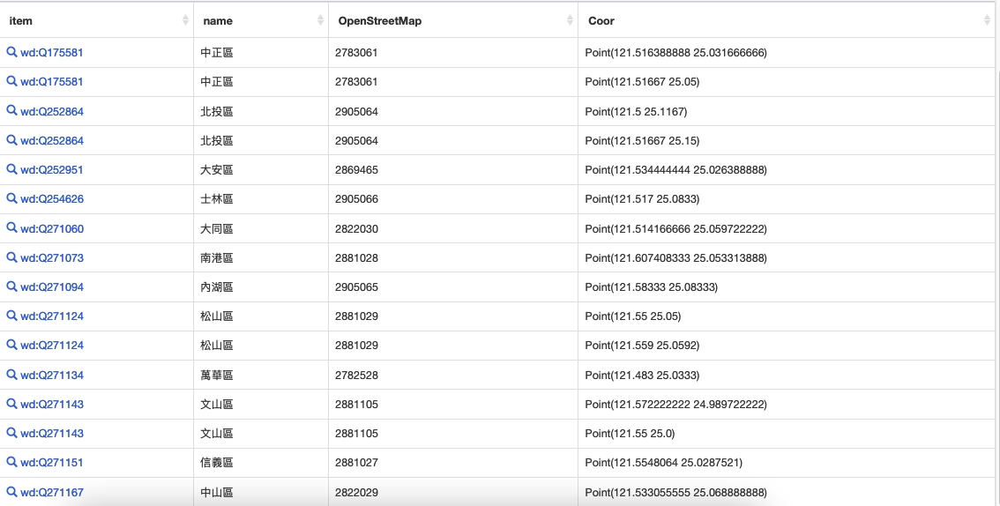

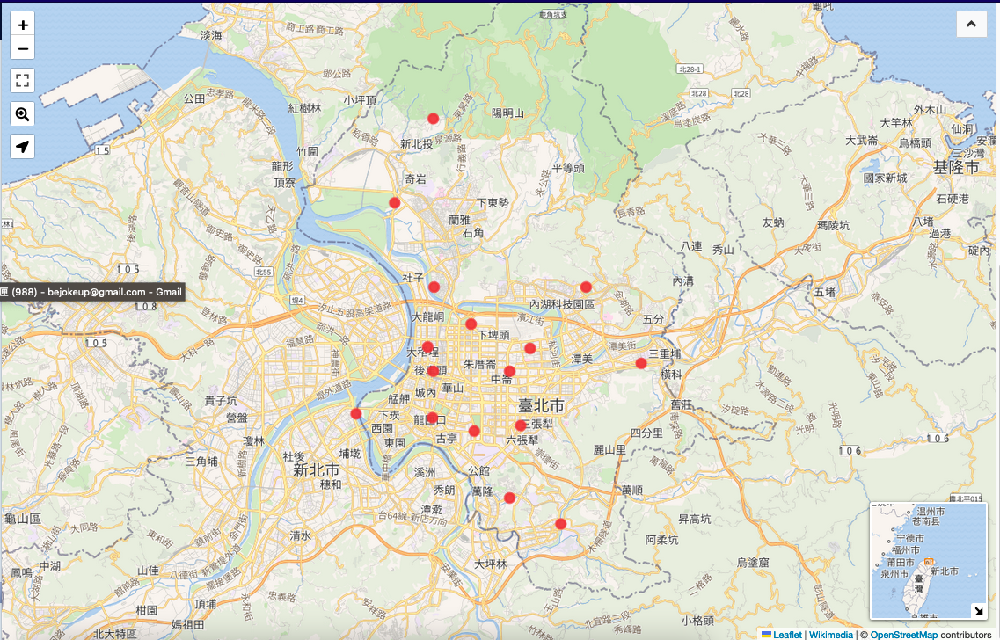

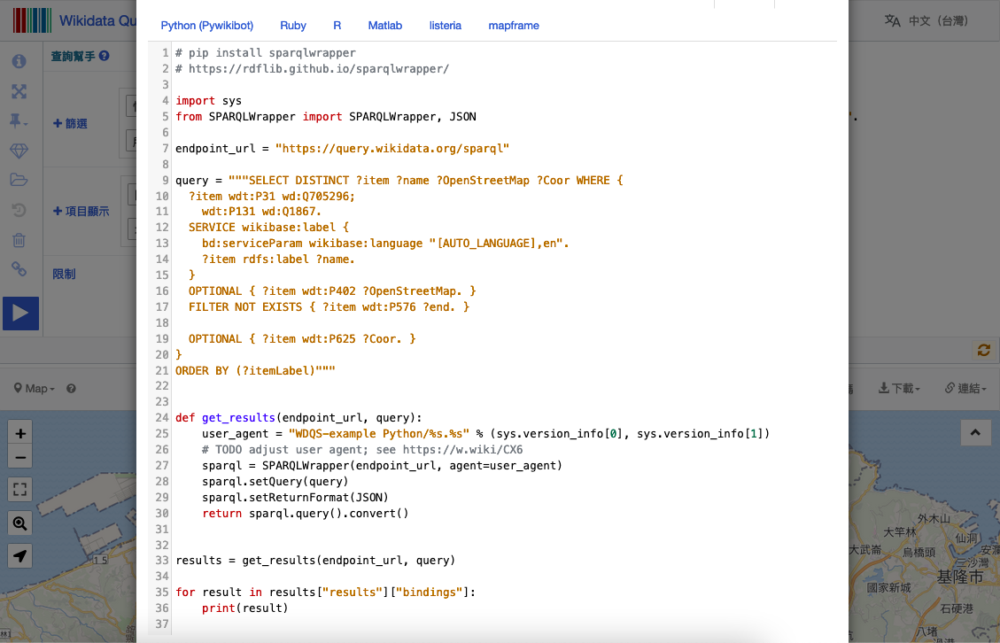

In [1]:
import requests

query = {
	"action": "wbsearchentities",
	"format": "json",
	"search": "南港區",
	"language": "zh",
	"limit": "50",
	"utf8": 1
}

response = requests.get('https://www.wikidata.org/w/api.php', params=query)
print(response.json())

# https://www.nylas.com/blog/use-python-requests-module-rest-apis/

{'searchinfo': {'search': '南港區'}, 'search': [{'id': 'Q271073', 'title': 'Q271073', 'pageid': 262353, 'concepturi': 'http://www.wikidata.org/entity/Q271073', 'repository': 'wikidata', 'url': '//www.wikidata.org/wiki/Q271073', 'display': {'label': {'value': 'Nangang District', 'language': 'en'}, 'description': {'value': 'district in Taipei', 'language': 'en'}}, 'label': 'Nangang District', 'description': 'district in Taipei', 'match': {'type': 'label', 'language': 'zh', 'text': '南港區'}, 'aliases': ['南港區']}, {'id': 'Q1963417', 'title': 'Q1963417', 'pageid': 1892543, 'concepturi': 'http://www.wikidata.org/entity/Q1963417', 'repository': 'wikidata', 'url': '//www.wikidata.org/wiki/Q1963417', 'display': {'label': {'value': 'Yuzhnoportovy District', 'language': 'en'}, 'description': {'value': 'human settlement in Russia', 'language': 'en'}}, 'label': 'Yuzhnoportovy District', 'description': 'human settlement in Russia', 'match': {'type': 'label', 'language': 'zh', 'text': '南港區'}, 'aliases': ['

In [2]:
response.json()['search']


[{'id': 'Q271073',
  'title': 'Q271073',
  'pageid': 262353,
  'concepturi': 'http://www.wikidata.org/entity/Q271073',
  'repository': 'wikidata',
  'url': '//www.wikidata.org/wiki/Q271073',
  'display': {'label': {'value': 'Nangang District', 'language': 'en'},
   'description': {'value': 'district in Taipei', 'language': 'en'}},
  'label': 'Nangang District',
  'description': 'district in Taipei',
  'match': {'type': 'label', 'language': 'zh', 'text': '南港區'},
  'aliases': ['南港區']},
 {'id': 'Q1963417',
  'title': 'Q1963417',
  'pageid': 1892543,
  'concepturi': 'http://www.wikidata.org/entity/Q1963417',
  'repository': 'wikidata',
  'url': '//www.wikidata.org/wiki/Q1963417',
  'display': {'label': {'value': 'Yuzhnoportovy District', 'language': 'en'},
   'description': {'value': 'human settlement in Russia', 'language': 'en'}},
  'label': 'Yuzhnoportovy District',
  'description': 'human settlement in Russia',
  'match': {'type': 'label', 'language': 'zh', 'text': '南港區'},
  'aliases':

In [3]:
qitem = 'Q271073'

In [4]:
# Wikidata Json output
# https://www.wikidata.org/wiki/Special:EntityData/Q42.json
# with urllib.request.urlopen("https://www.wikidata.org/wiki/Special:EntityData/Q10875759.json") as url2:
#     data = json.loads(url2.read().decode())
#     print(data)
import requests

# response2 = requests.get('https://www.wikidata.org/wiki/Special:EntityData/r"qitem".json')
response2 = requests.get('https://www.wikidata.org/wiki/Special:EntityData/Q271073.json')

# https://www.wikidata.org/wiki/Special:EntityData/Q42.json

In [5]:
response2.json()

{'entities': {'Q271073': {'pageid': 262353,
   'ns': 0,
   'title': 'Q271073',
   'lastrevid': 2215308733,
   'modified': '2024-07-29T07:45:01Z',
   'type': 'item',
   'id': 'Q271073',
   'labels': {'zh': {'language': 'zh', 'value': '南港區'},
    'de': {'language': 'de', 'value': 'Nangang'},
    'de-ch': {'language': 'de-ch', 'value': 'Nangang'},
    'en': {'language': 'en', 'value': 'Nangang District'},
    'en-ca': {'language': 'en-ca', 'value': 'Nangang District, Taipei'},
    'en-gb': {'language': 'en-gb', 'value': 'Nangang District'},
    'fr': {'language': 'fr', 'value': 'district de Nangang'},
    'hak': {'language': 'hak', 'value': 'Nàm-kóng-khî'},
    'id': {'language': 'id', 'value': 'Distrik Nangang'},
    'ja': {'language': 'ja', 'value': '南港区'},
    'ko': {'language': 'ko', 'value': '난강구'},
    'vi': {'language': 'vi', 'value': 'Nam Cảng'},
    'it': {'language': 'it', 'value': 'Distretto di Nangang'},
    'nan': {'language': 'nan', 'value': 'Lâm-káng-khu'},
    'lt': {'lang

In [6]:
response2.encoding = 'utf-8'
print("encoding: %s" % response2.encoding)
# https://sjkou.net/2017/01/06/python-requests-encoding/

encoding: utf-8


In [7]:
print(response2.text)

{"entities":{"Q271073":{"pageid":262353,"ns":0,"title":"Q271073","lastrevid":2215308733,"modified":"2024-07-29T07:45:01Z","type":"item","id":"Q271073","labels":{"zh":{"language":"zh","value":"\u5357\u6e2f\u5340"},"de":{"language":"de","value":"Nangang"},"de-ch":{"language":"de-ch","value":"Nangang"},"en":{"language":"en","value":"Nangang District"},"en-ca":{"language":"en-ca","value":"Nangang District, Taipei"},"en-gb":{"language":"en-gb","value":"Nangang District"},"fr":{"language":"fr","value":"district de Nangang"},"hak":{"language":"hak","value":"N\u00e0m-k\u00f3ng-kh\u00ee"},"id":{"language":"id","value":"Distrik Nangang"},"ja":{"language":"ja","value":"\u5357\u6e2f\u533a"},"ko":{"language":"ko","value":"\ub09c\uac15\uad6c"},"vi":{"language":"vi","value":"Nam C\u1ea3ng"},"it":{"language":"it","value":"Distretto di Nangang"},"nan":{"language":"nan","value":"L\u00e2m-k\u00e1ng-khu"},"lt":{"language":"lt","value":"Nangangas"},"zh-tw":{"language":"zh-tw","value":"\u5357\u6e2f\u5340"},

In [8]:
data = response2.json()['entities']['Q271073']['labels']

In [9]:
type(data)

dict

In [10]:
data


{'zh': {'language': 'zh', 'value': '南港區'},
 'de': {'language': 'de', 'value': 'Nangang'},
 'de-ch': {'language': 'de-ch', 'value': 'Nangang'},
 'en': {'language': 'en', 'value': 'Nangang District'},
 'en-ca': {'language': 'en-ca', 'value': 'Nangang District, Taipei'},
 'en-gb': {'language': 'en-gb', 'value': 'Nangang District'},
 'fr': {'language': 'fr', 'value': 'district de Nangang'},
 'hak': {'language': 'hak', 'value': 'Nàm-kóng-khî'},
 'id': {'language': 'id', 'value': 'Distrik Nangang'},
 'ja': {'language': 'ja', 'value': '南港区'},
 'ko': {'language': 'ko', 'value': '난강구'},
 'vi': {'language': 'vi', 'value': 'Nam Cảng'},
 'it': {'language': 'it', 'value': 'Distretto di Nangang'},
 'nan': {'language': 'nan', 'value': 'Lâm-káng-khu'},
 'lt': {'language': 'lt', 'value': 'Nangangas'},
 'zh-tw': {'language': 'zh-tw', 'value': '南港區'},
 'zh-hant': {'language': 'zh-hant', 'value': '南港區'},
 'nl': {'language': 'nl', 'value': 'Nangang District, Taipei'},
 'hy': {'language': 'hy', 'value': 'Նա

In [15]:
data.get('zh-tw').get('value')

'南港區'

In [17]:
for d in data:
#     print("name:" + str(d) + "=" + str(data.get(d).get('value')))
    print("name:%s=%s" 
        % (d, data.get(d).get('value')) )   
#     print("name:%s=%s" 
#         % (bindings ['Label'] ["xml:lang"], bindings ['Label'] ["value"]))    

name:zh=南港區
name:de=Nangang
name:de-ch=Nangang
name:en=Nangang District
name:en-ca=Nangang District, Taipei
name:en-gb=Nangang District
name:fr=district de Nangang
name:hak=Nàm-kóng-khî
name:id=Distrik Nangang
name:ja=南港区
name:ko=난강구
name:vi=Nam Cảng
name:it=Distretto di Nangang
name:nan=Lâm-káng-khu
name:lt=Nangangas
name:zh-tw=南港區
name:zh-hant=南港區
name:nl=Nangang District, Taipei
name:hy=Նանգանգ
name:uk=Наньган
name:pl=Nangang
name:he=מחוז ננגאנג
name:yue=南港區
name:ca=Nangang
name:zh-hk=南港區
name:ceb=Nangang District
name:lzh=南港區


In [ ]:
data.get('nan-latn-pehoeji').get('value')

In [14]:
import json


data2 = json.dumps(response).decode()
# https://realpython.com/python-json/

TypeError: Object of type Response is not JSON serializable

In [21]:
for i in range(len(data)):
    bindings = data[i]
    print("name:%s=%s" 
        % (bindings ['Label'] ["xml:lang"], bindings ['Label'] ["value"]))

KeyError: 0

In [2]:
# pip install SPARQLWrapper

#!pip install sparqlwrapper
# Sparqlwrapper 在 Jupyter Notebook 跑不起來

# pip install git+https://github.com/rdflib/sparqlwrapper#egg=sparqlwrapper
# conda install -c conda-forge sparqlwrapper 
# conda install -c conda-forge/label/cf202003 sparqlwrapper 
# https://rdflib.github.io/sparqlwrapper/

In [2]:
import requests

In [5]:
# 🔍 User input: Explore any Wikidata item by QID
qid = input("Enter a Wikidata QID (e.g., Q42): ").strip()
url = f"https://www.wikidata.org/wiki/Special:EntityData/{qid}.json"
data = requests.get(url).json()

entity = data['entities'][qid]
label = entity['labels']['zh-tw']['value']
desc = entity['descriptions']['zh-tw']['value']

print(f"Label: {label}")
print(f"Description: {desc}")


Enter a Wikidata QID (e.g., Q42): Q15
Label: 非洲
Description: 地球上的在北半球和南半球的大陸


In [18]:
import requests
#import helper
import pandas as pd

endpoint_url = "https://query.wikidata.org/sparql"

query = """SELECT DISTINCT ?ref ?placeLabel ?item ?itemLabel ?label_zh_tw ?label_zh_hant ?label_en ?osm_id ?item_lat ?item_lon WHERE {
  ?item wdt:P31 wd:Q7930614;
    (wdt:P131+) wd:Q140631.
  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],zh-tw, zh, en". }
  OPTIONAL {
    ?item rdfs:label ?label_en.
    FILTER((LANG(?label_en)) = "en")
  }
  OPTIONAL {
    ?item rdfs:label ?label_zh_tw.
    FILTER((LANG(?label_zh_tw)) = "zh-tw")
  }
  OPTIONAL {
    ?item rdfs:label ?label_zh_hant.
    FILTER((LANG(?label_zh_hant)) = "zh-hant")
  }
  OPTIONAL { ?item wdt:P131 ?place. }
  FILTER NOT EXISTS { ?item wdt:P576 ?end. }  
  ?item wdt:P402 ?osm_id.

  ?item p:P625/psv:P625  ?coor.
  ?coor wikibase:geoLatitude ?item_lat.
  ?coor wikibase:geoLongitude ?item_lon.

  ?item wdt:P5020 ?ref. 
}
ORDER BY (?ref)"""
# https://towardsdatascience.com/where-do-mayors-come-from-querying-wikidata-with-python-and-sparql-91f3c0af22e2

#   # Get latitude longitude coordinates of capital
#   ?capital p:P625/psv:P625 ?capital_node.
#   ?capital_node wikibase:geoLatitude ?capital_lat.
#   ?capital_node wikibase:geoLongitude ?capital_lon.

# def get_results(endpoint_url, query):
#     user_agent = "WDQS-example Python/%s.%s" % (sys.version_info[0], sys.version_info[1])
#     # TODO adjust user agent; see https://w.wiki/CX6
#     sparql = SPARQLWrapper(endpoint_url, agent=user_agent)
#     sparql.setQuery(query)
#     sparql.setReturnFormat(JSON)
#     return sparql.query().convert()


# results = get_results(endpoint_url, query)

# for result in results["results"]["bindings"]:
#     print(result)


In [19]:
data = requests.get(endpoint_url, params={'query': query, 'format': 'json'}).json()

# for result in data["results"]["bindings"]:
#     print(result)



In [20]:
data['results']['bindings'][1]

{'ref': {'type': 'literal', 'value': '67000010002'},
 'placeLabel': {'xml:lang': 'zh-tw', 'type': 'literal', 'value': '新營區'},
 'item': {'type': 'uri', 'value': 'http://www.wikidata.org/entity/Q96976052'},
 'itemLabel': {'xml:lang': 'zh-tw', 'type': 'literal', 'value': '民權里'},
 'label_zh_tw': {'xml:lang': 'zh-tw', 'type': 'literal', 'value': '民權里'},
 'label_zh_hant': {'xml:lang': 'zh-hant', 'type': 'literal', 'value': '民權里'},
 'label_en': {'xml:lang': 'en', 'type': 'literal', 'value': 'Minquan Village'},
 'osm_id': {'type': 'literal', 'value': '3818636'},
 'item_lat': {'datatype': 'http://www.w3.org/2001/XMLSchema#double',
  'type': 'literal',
  'value': '23.307147549958'},
 'item_lon': {'datatype': 'http://www.w3.org/2001/XMLSchema#double',
  'type': 'literal',
  'value': '120.31431595823'}}

In [21]:
# ?ref ?placeLabel ?item ?itemLabel ?label_zh_tw ?label_zh_hant ?label_en ?OpenStreetMap ?coor
villages = []
for x in data['results']['bindings']:
    villages.append({
        'osm': x['osm_id']['value'],
        'wikidata': x['item']['value'],
        'name': x['itemLabel']['value'],
        'ref': x['ref']['value'],
        'latitude': x['item_lat']['value'],
        'longitude': x['item_lon']['value']
    })

df = pd.DataFrame(villages)
# print(len(df))
# df.head(10)
        
# districts = []
# for item in data['results']['bindings']:
#     districts.append({
#         'wikidata': item['district']['value'],
#         'name': item['name']['value'],
#         'Hu': item['Hu']['value'],
#         'OpenStreetMap': item['OpenStreetMap']['value']})

# df = pd.DataFrame(districts)
# print(len(df))
# df.head(12)        

In [22]:
df.head(10)

,osm,wikidata,name,ref,latitude,longitude
0,3818631,http://www.wikidata.org/entity/Q96976051,忠政里,67000010001,23.315191008361,120.31440330716
1,3818636,http://www.wikidata.org/entity/Q96976052,民權里,67000010002,23.307147549958,120.31431595823
2,3818619,http://www.wikidata.org/entity/Q96976054,三仙里,67000010003,23.311796861602,120.31117823017
3,3818627,http://www.wikidata.org/entity/Q10934893,大宏里,67000010007,23.308981822892,120.32055627533
4,3818641,http://www.wikidata.org/entity/Q96976059,王公里,67000010008,23.315487035124,120.31885795901
5,3818620,http://www.wikidata.org/entity/Q96976060,中營里,67000010009,23.308758927405,120.32902092507
6,3818625,http://www.wikidata.org/entity/Q96976061,土庫里,67000010010,23.320645142694,120.33918906597
7,3818623,http://www.wikidata.org/entity/Q96976063,南興里,67000010012,23.298144783723,120.30658082032
8,3818643,http://www.wikidata.org/entity/Q96976064,興業里,67000010013,23.299625418022,120.31916050571
9,3818637,http://www.wikidata.org/entity/Q96976065,民生里,67000010014,23.306116804351,120.30713161663


In [23]:
len(df)

650

In [24]:
endpoint_url = "https://query.wikidata.org/sparql"

query = """SELECT DISTINCT ?ref ?placeLabel ?item ?itemLabel ?label_zh_tw ?label_zh_hant ?label_en ?osm_id ?item_lat ?item_lon WHERE {
  ?item wdt:P31 wd:Q7930614;
    (wdt:P131+) wd:Q140631.
  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],zh-tw, zh, en". }
  OPTIONAL {
    ?item rdfs:label ?label_en.
    FILTER((LANG(?label_en)) = "en")
  }
  OPTIONAL {
    ?item rdfs:label ?label_zh_tw.
    FILTER((LANG(?label_zh_tw)) = "zh-tw")
  }
  OPTIONAL {
    ?item rdfs:label ?label_zh_hant.
    FILTER((LANG(?label_zh_hant)) = "zh-hant")
  }
  OPTIONAL { ?item wdt:P131 ?place. }

  OPTIONAL { ?item wdt:P402 ?osm_id. }

  ?item p:P625/psv:P625  ?coor.
  ?coor wikibase:geoLatitude ?item_lat.
  ?coor wikibase:geoLongitude ?item_lon.

  ?item wdt:P5020 ?ref. 
}
ORDER BY (?ref)"""

In [25]:
data2 = requests.get(endpoint_url, params={'query': query, 'format': 'json'}).json()


In [26]:
data2

{'head': {'vars': ['ref',
   'placeLabel',
   'item',
   'itemLabel',
   'label_zh_tw',
   'label_zh_hant',
   'label_en',
   'osm_id',
   'item_lat',
   'item_lon']},
 'results': {'bindings': [{'ref': {'type': 'literal', 'value': '67000010001'},
    'placeLabel': {'xml:lang': 'zh-tw', 'type': 'literal', 'value': '新營區'},
    'item': {'type': 'uri',
     'value': 'http://www.wikidata.org/entity/Q96976051'},
    'itemLabel': {'xml:lang': 'zh-tw', 'type': 'literal', 'value': '忠政里'},
    'label_zh_tw': {'xml:lang': 'zh-tw', 'type': 'literal', 'value': '忠政里'},
    'label_zh_hant': {'xml:lang': 'zh-hant',
     'type': 'literal',
     'value': '忠政里'},
    'label_en': {'xml:lang': 'en',
     'type': 'literal',
     'value': 'Zhongzheng Village'},
    'osm_id': {'type': 'literal', 'value': '3818631'},
    'item_lat': {'datatype': 'http://www.w3.org/2001/XMLSchema#double',
     'type': 'literal',
     'value': '23.315191008361'},
    'item_lon': {'datatype': 'http://www.w3.org/2001/XMLSchema#dou

In [27]:
villages2 = []
osm_list = []
for x in data2['results']['bindings']:
    try:
        osm_list.append(x['osm_id']['value'])
    except:
        osm_list.append(None)

wikidata_list = []
for x in data2['results']['bindings']:
    try:
        wikidata_list.append(x['item']['value'])
    except:
        wikidata_list.append(None)  

name_list = []
for x in data2['results']['bindings']:
    try:
        name_list.append(x['itemLabel']['value'])
    except:
        name_list.append(None)

ref_list = []
for x in data2['results']['bindings']:
    try:
        ref_list.append(x['ref']['value'])
    except:
        ref_list.append(None)
        
latitude_list = []
for x in data2['results']['bindings']:
    try:
        latitude_list.append(x['item_lat']['value'])
    except:
        latitude_list.append(None)
        
longitude_list = []
for x in data2['results']['bindings']:
    try:
        longitude_list.append(x['item_lon']['value'])
    except:
        longitude_list.append(None)
# villages2 = 
# villages2.append({
#         'osm': osm_list,
#         'wikidata': wikidata_list,
#         'name': name_list,
#         'ref': ref_list,
#         'latitude': latitude_list,
#         'longitude': longitude_list
#     })
# villages2 = []
# for x in data2['results']['bindings']:        
#         villages2.append({
#             'osm': x['osm_id']['value'],
#             'wikidata': x['item']['value'],
#             'name': x['itemLabel']['value'],
#             'ref': x['ref']['value'],
#             'latitude': x['item_lat']['value'],
#             'longitude': x['item_lon']['value']
#         })
#     except:
#         villages2.append({
#             'osm': None,
#             'wikidata': None,
#             'name': None,
#             'ref': None,
#             'latitude': None,
#             'longitude': None
#         })
#     except:
#         villages.append({
#             'osm': None,
#             'wikidata': None,
#             'name': None,
#             'ref': None,
#             'latitude': None,
#             'longitude': None
#         })
# https://stackoverflow.com/questions/26219734/empty-values-in-a-python-list

# df = pd.DataFrame(villages)

In [28]:
len(ref_list)

651

In [29]:
wikidata_list

['http://www.wikidata.org/entity/Q96976051',
 'http://www.wikidata.org/entity/Q96976052',
 'http://www.wikidata.org/entity/Q96976054',
 'http://www.wikidata.org/entity/Q10934893',
 'http://www.wikidata.org/entity/Q96976059',
 'http://www.wikidata.org/entity/Q96976060',
 'http://www.wikidata.org/entity/Q96976061',
 'http://www.wikidata.org/entity/Q96976063',
 'http://www.wikidata.org/entity/Q96976064',
 'http://www.wikidata.org/entity/Q96976065',
 'http://www.wikidata.org/entity/Q96976066',
 'http://www.wikidata.org/entity/Q96976067',
 'http://www.wikidata.org/entity/Q96976068',
 'http://www.wikidata.org/entity/Q96976070',
 'http://www.wikidata.org/entity/Q96976071',
 'http://www.wikidata.org/entity/Q96976073',
 'http://www.wikidata.org/entity/Q96976076',
 'http://www.wikidata.org/entity/Q96976083',
 'http://www.wikidata.org/entity/Q96976085',
 'http://www.wikidata.org/entity/Q96976086',
 'http://www.wikidata.org/entity/Q96976088',
 'http://www.wikidata.org/entity/Q96976089',
 'http://w

In [30]:
# df2 = pd.DataFrame(osm_list, wikidata_list, name_list, ref_list, latitude_list, longitude_list, columns = ['osm', 'wikidata' 'name', 'ref', 'latitude', 'longitude'])
# https://stackoverflow.com/questions/30522724/take-multiple-lists-into-dataframe
df2 = pd.DataFrame(
    {
        'osm': osm_list,
        'wikidata': wikidata_list,
        'name': name_list,
        'ref': ref_list,
        'latitude': latitude_list,
        'longitude': longitude_list
    })

In [31]:
df2.head(10)

,osm,wikidata,name,ref,latitude,longitude
0,3818631,http://www.wikidata.org/entity/Q96976051,忠政里,67000010001,23.315191008361,120.31440330716
1,3818636,http://www.wikidata.org/entity/Q96976052,民權里,67000010002,23.307147549958,120.31431595823
2,3818619,http://www.wikidata.org/entity/Q96976054,三仙里,67000010003,23.311796861602,120.31117823017
3,3818627,http://www.wikidata.org/entity/Q10934893,大宏里,67000010007,23.308981822892,120.32055627533
4,3818641,http://www.wikidata.org/entity/Q96976059,王公里,67000010008,23.315487035124,120.31885795901
5,3818620,http://www.wikidata.org/entity/Q96976060,中營里,67000010009,23.308758927405,120.32902092507
6,3818625,http://www.wikidata.org/entity/Q96976061,土庫里,67000010010,23.320645142694,120.33918906597
7,3818623,http://www.wikidata.org/entity/Q96976063,南興里,67000010012,23.298144783723,120.30658082032
8,3818643,http://www.wikidata.org/entity/Q96976064,興業里,67000010013,23.299625418022,120.31916050571
9,3818637,http://www.wikidata.org/entity/Q96976065,民生里,67000010014,23.306116804351,120.30713161663


In [32]:
df2.loc[81]

osm                                              None
wikidata     http://www.wikidata.org/entity/Q21449533
name                                              頂長里
ref                                       67000050020
latitude                                   23.3656414
longitude                                  120.327695
Name: 81, dtype: object

In [33]:
df2.describe()

,osm,wikidata,name,ref,latitude,longitude
count,650,651,651,651,651,651
unique,649,650,602,651,646,647
top,3761728,http://www.wikidata.org/entity/Q63982279,南勢里,67000010001,23.0252778,120.2354061
freq,2,2,3,1,2,2


In [34]:
df2

,osm,wikidata,name,ref,latitude,longitude
0,3818631,http://www.wikidata.org/entity/Q96976051,忠政里,67000010001,23.315191008361,120.31440330716
1,3818636,http://www.wikidata.org/entity/Q96976052,民權里,67000010002,23.307147549958,120.31431595823
2,3818619,http://www.wikidata.org/entity/Q96976054,三仙里,67000010003,23.311796861602,120.31117823017
3,3818627,http://www.wikidata.org/entity/Q10934893,大宏里,67000010007,23.308981822892,120.32055627533
4,3818641,http://www.wikidata.org/entity/Q96976059,王公里,67000010008,23.315487035124,120.31885795901
...,...,...,...,...,...,...
646,3713913,http://www.wikidata.org/entity/Q108470398,兌悅里,67000370044,23.000798342628,120.19468366267
647,3713915,http://www.wikidata.org/entity/Q108470399,淺草里,67000370045,22.995194884039,120.19392978776
648,3713918,http://www.wikidata.org/entity/Q108470400,府前里,67000370046,22.992190480514,120.19467574335
649,3713934,http://www.wikidata.org/entity/Q108470402,南廠里,67000370047,22.989285969754,120.19387651057


In [35]:
results['results']['bindings'][0]

NameError: name 'results' is not defined

In [37]:
condo geopandas

SyntaxError: invalid syntax (3810865533.py, line 1)

In [36]:
#
import geopandas as gpd

df2.explore(tooltip=["name"], highlight=True)

# 試試geopandas的explore
# monuments_gdf.explore(tooltip=["name:en"], highlight=True)
# https://www.kaggle.com/code/maxim75/loading-data-from-osm-using-overpass-api/notebook

AttributeError: 'DataFrame' object has no attribute 'explore'

In [16]:
villages_list = results['results']['bindings']

In [17]:
type(villages_list)

list

In [18]:
ref_list = []
placeLabel_list = []
item_list = []
itemLabel_list = []

for d in range(len(villages_list)):
    ref_list.append((villages_list[d]).get('ref').get('value'))
    placeLabel_list.append((villages_list[d]).get('placeLabel').get('value'))
    item_list.append((villages_list[d]).get('item').get('value'))
    itemLabel_list.append((villages_list[d]).get('itemLabel').get('value'))

In [19]:
print(len(ref_list))
print(len(placeLabel_list))
print(len(item_list))
print(len(itemLabel_list))

778
778
778
778


In [20]:
# item_list = item_list.replace('http://www.wikidata.org/entity/','')
temp = []
for i in item_list:
    temp.append(i.replace('http://www.wikidata.org/entity/',''))

In [21]:
list_dict = {
                "ref": ref_list,
                "place": placeLabel_list,
                "item": temp, 
                "itemLabel": itemLabel_list
}

In [22]:
df_village = pd.DataFrame(list_dict)

In [23]:
df_village.head(20)

,ref,place,item,itemLabel
0,67000010001,新營區,Q96976051,忠政里
1,67000010002,新營區,Q96976052,民權里
2,67000010003,新營區,Q96976054,三仙里
3,67000010004,新營區,Q96976055,好平里
4,67000010005,新營區,Q96976056,延平里
5,67000010006,新營區,Q96976057,永生里
6,67000010007,新營區,Q96976058,大宏里
7,67000010008,新營區,Q96976059,王公里
8,67000010009,新營區,Q96976060,中營里
9,67000010010,新營區,Q96976061,土庫里


## 匯入的前處理

* 找到對應的 Wikidata 屬性
* 符合授權規範
* 整理成 csv 格式

## Regular Expression

* 快速指南：https://www.rexegg.com/regex-quickstart.html
* 線上互動教學：https://regexlearn.com/
* 測試指令：https://regex101.com/


In [1]:
import json

# https://stackoverflow.com/questions/52509254/python-using-json-to-import-geojson-and-printing-specific-data
# with open("Liuzhou-Wikidata.json") as f:
#     data = json.load(f)

import urllib.request
# https://stackoverflow.com/questions/12965203/how-to-get-json-from-webpage-into-python-script

In [2]:
import pandas as pd
# import geopandas as gpd
import numpy as np

In [3]:
df_data = pd.read_json('https://od.moi.gov.tw/api/v1/rest/datastore/301000000A-001206-261')


# with urllib.request.urlopen("https://od.moi.gov.tw/api/v1/rest/datastore/301000000A-001206-261") as url:
#     data = json.loads(url.read().decode())
#     print(data)

# with open(https://tcgbusfs.blob.core.windows.net/dotapp/youbike/v2/youbike_immediate.json) as json_file:
#     data = json.load(json_file)
#     for p in data['people']:
#         print('Name: ' + p['name'])
#         print('Website: ' + p['website'])
#         print('From: ' + p['from'])
#         print('')

URLError: <urlopen error [Errno 60] Operation timed out>

In [ ]:
df_data.head()

In [38]:
data3 = requests.get('https://od.moi.gov.tw/api/v1/rest/datastore/301000000A-001206-261').json()

# data = requests.get(endpoint_url, params={'query': query, 'format': 'json'}).json()

# villages = []
# for x in data['results']['bindings']:
#     villages.append({
#         'osm': x['osm_id']['value'],
#         'wikidata': x['item']['value'],
#         'name': x['itemLabel']['value'],
#         'ref': x['ref']['value'],
#         'latitude': x['item_lat']['value'],
#         'longitude': x['item_lon']['value']
#     })

# df = pd.DataFrame(villages)

JSONDecodeError: Expecting value: line 4 column 1 (char 3)

In [ ]:
data3

In [ ]:
population = []

# https://sparkbyexamples.com/python/how-to-start-python-for-loop-at-1/?expand_article=1

for p in data3['result']['records'] in range(1:len(data3['result']['records']):
    population.append({
        'date' : p['statistic_yyymm']['id'],
        'ref': p['district_code']['id'],
        'upper': p['site_id']['id'],
        'name': p['village']['id'],
        'household_no': p['household_no']['id'],
        'population': p['people_total']['id'],
        'male': p['people_total_m']['id'],
        'female': p['people_total_f']['id']
    })
    
df3 = pd.DataFrame(population)

In [39]:
data3['result']['records'][1]

{'statistic_yyymm': '11205',
 'district_code': '65000010001',
 'site_id': '新北市板橋區',
 'village': '留侯里',
 'household_no': '685',
 'people_total': '1644',
 'people_total_m': '775',
 'people_total_f': '869',
 'people_age_000_m': '5',
 'people_age_000_f': '2',
 'people_age_001_m': '6',
 'people_age_001_f': '2',
 'people_age_002_m': '3',
 'people_age_002_f': '5',
 'people_age_003_m': '3',
 'people_age_003_f': '4',
 'people_age_004_m': '9',
 'people_age_004_f': '10',
 'people_age_005_m': '9',
 'people_age_005_f': '3',
 'people_age_006_m': '17',
 'people_age_006_f': '11',
 'people_age_007_m': '9',
 'people_age_007_f': '13',
 'people_age_008_m': '13',
 'people_age_008_f': '5',
 'people_age_009_m': '9',
 'people_age_009_f': '8',
 'people_age_010_m': '13',
 'people_age_010_f': '15',
 'people_age_011_m': '7',
 'people_age_011_f': '11',
 'people_age_012_m': '8',
 'people_age_012_f': '8',
 'people_age_013_m': '9',
 'people_age_013_f': '5',
 'people_age_014_m': '9',
 'people_age_014_f': '9',
 'people

In [27]:
# dump = df_data['result']['records']
data3 = df_data.json()['result']['records']

AttributeError: 'DataFrame' object has no attribute 'json'

In [13]:
dump

[{'statistic_yyymm': '統計年月',
  'district_code': '區域別代碼',
  'site_id': '區域別',
  'village': '村里',
  'household_no': '戶數',
  'people_total': '人口數',
  'people_total_m': '人口數-男',
  'people_total_f': '人口數-女',
  'people_age_000_m': '0歲-男',
  'people_age_000_f': '0歲-女',
  'people_age_001_m': '1歲-男',
  'people_age_001_f': '1歲-女',
  'people_age_002_m': '2歲-男',
  'people_age_002_f': '2歲-女',
  'people_age_003_m': '3歲-男',
  'people_age_003_f': '3歲-女',
  'people_age_004_m': '4歲-男',
  'people_age_004_f': '4歲-女',
  'people_age_005_m': '5歲-男',
  'people_age_005_f': '5歲-女',
  'people_age_006_m': '6歲-男',
  'people_age_006_f': '6歲-女',
  'people_age_007_m': '7歲-男',
  'people_age_007_f': '7歲-女',
  'people_age_008_m': '8歲-男',
  'people_age_008_f': '8歲-女',
  'people_age_009_m': '9歲-男',
  'people_age_009_f': '9歲-女',
  'people_age_010_m': '10歲-男',
  'people_age_010_f': '10歲-女',
  'people_age_011_m': '11歲-男',
  'people_age_011_f': '11歲-女',
  'people_age_012_m': '12歲-男',
  'people_age_012_f': '12歲-女',
  'people_a

In [12]:
df_data2 = pd.read_json(dump)

ValueError: Invalid file path or buffer object type: <class 'list'>

In [1]:
import requests
import json

# SPARQL endpoint for Wikidata
url = "https://query.wikidata.org/sparql"

# SPARQL query to get all villages in Taiwan
query = """
SELECT ?village ?villageLabel ?coordinate WHERE {
  ?village wdt:P31 wd:Q532;         # Instance of village
           wdt:P17 wd:Q865.         # Country: Taiwan
  OPTIONAL { ?village wdt:P625 ?coordinate. }  # Coordinates if available
  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],en". }
}
"""



In [2]:
# Send request to Wikidata SPARQL endpoint
headers = {
    "Accept": "application/json"
}
response = requests.get(url, params={"query": query}, headers=headers)

# Parse JSON response
data = response.json()



In [3]:
# Extract results
villages = []
for item in data['results']['bindings']:
    name = item['villageLabel']['value']
    qid = item['village']['value']
    coord = item.get('coordinate', {}).get('value', None)
    villages.append({
        "name": name,
        "wikidata_id": qid,
        "coordinate": coord
    })

# Print sample results
for v in villages[:10]:
    print(v)


{'name': 'Port of Houfeng', 'wikidata_id': 'http://www.wikidata.org/entity/Q11070252', 'coordinate': 'http://www.wikidata.org/.well-known/genid/f2c713ae1750bd75c0ab4495e388c94e'}
{'name': 'Q11175063', 'wikidata_id': 'http://www.wikidata.org/entity/Q11175063', 'coordinate': None}
{'name': 'Daguan Village', 'wikidata_id': 'http://www.wikidata.org/entity/Q15938852', 'coordinate': 'Point(120.977303657 24.307940701)'}
{'name': 'Tongmen Village', 'wikidata_id': 'http://www.wikidata.org/entity/Q17164676', 'coordinate': 'Point(121.493 23.964)'}
{'name': 'Houtong', 'wikidata_id': 'http://www.wikidata.org/entity/Q28418916', 'coordinate': 'Point(121.82786 25.087108)'}
{'name': 'Jinling Village', 'wikidata_id': 'http://www.wikidata.org/entity/Q65059792', 'coordinate': 'Point(120.505418483 24.01146179)'}
{'name': 'Favorlang', 'wikidata_id': 'http://www.wikidata.org/entity/Q85884409', 'coordinate': None}
{'name': 'Heping Village', 'wikidata_id': 'http://www.wikidata.org/entity/Q97026883', 'coordinat

In [5]:
data

{'head': {'vars': ['village', 'villageLabel', 'coordinate']},
 'results': {'bindings': [{'village': {'type': 'uri',
     'value': 'http://www.wikidata.org/entity/Q11070252'},
    'coordinate': {'type': 'uri',
     'value': 'http://www.wikidata.org/.well-known/genid/f2c713ae1750bd75c0ab4495e388c94e'},
    'villageLabel': {'xml:lang': 'en',
     'type': 'literal',
     'value': 'Port of Houfeng'}},
   {'village': {'type': 'uri',
     'value': 'http://www.wikidata.org/entity/Q11175063'},
    'villageLabel': {'type': 'literal', 'value': 'Q11175063'}},
   {'village': {'type': 'uri',
     'value': 'http://www.wikidata.org/entity/Q15938852'},
    'coordinate': {'datatype': 'http://www.opengis.net/ont/geosparql#wktLiteral',
     'type': 'literal',
     'value': 'Point(120.977303657 24.307940701)'},
    'villageLabel': {'xml:lang': 'en',
     'type': 'literal',
     'value': 'Daguan Village'}},
   {'village': {'type': 'uri',
     'value': 'http://www.wikidata.org/entity/Q17164676'},
    'coordi

In [6]:
import requests
import geopandas as gpd
import pandas as pd
from shapely import wkt



In [25]:
# SPARQL endpoint
url = "https://query.wikidata.org/sparql"

# SPARQL query to get villages in Taiwan with WKT boundaries via P420
query = """
SELECT ?village ?villageLabel ?osm_id WHERE {
  ?village wdt:P31 wd:Q532;         # instance of village
           wdt:P17 wd:Q865;         # country is Taiwan
           wdt:P402 ?osm_id.           # OpenStreetMap ID
  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],en". }
}
"""

headers = {"Accept": "application/json"}
response = requests.get(url, params={"query": query}, headers=headers)
data = response.json()



In [15]:
data["results"]["bindings"]

[{'village': {'type': 'uri',
   'value': 'http://www.wikidata.org/entity/Q15938852'},
  'villageLabel': {'xml:lang': 'en',
   'type': 'literal',
   'value': 'Daguan Village'}},
 {'village': {'type': 'uri',
   'value': 'http://www.wikidata.org/entity/Q17164676'},
  'villageLabel': {'xml:lang': 'en',
   'type': 'literal',
   'value': 'Tongmen Village'}},
 {'village': {'type': 'uri',
   'value': 'http://www.wikidata.org/entity/Q65059792'},
  'villageLabel': {'xml:lang': 'en',
   'type': 'literal',
   'value': 'Jinling Village'}},
 {'village': {'type': 'uri',
   'value': 'http://www.wikidata.org/entity/Q97026883'},
  'villageLabel': {'xml:lang': 'en',
   'type': 'literal',
   'value': 'Heping Village'}}]

In [26]:
# Process results
records = []
for item in data['results']['bindings']:
    name = item['villageLabel']['value']
    qid = item['village']['value'].split('/')[-1]
    osm_id  = item['osm_id']['value']
    
    records.append({
        "name": name,
        "wikidata_id": qid,
        "osm_relation_id": osm_id
    })

# Load into GeoDataFrame
# gdf = gpd.GeoDataFrame(records, geometry="geometry", crs="EPSG:4326")

# Preview
print(gdf.head())


ValueError: Unknown column geometry

In [20]:
import requests
import pandas as pd

# SPARQL endpoint and query
url = "https://query.wikidata.org/sparql"

query = """
SELECT ?village ?villageLabel ?osm_id WHERE {
  ?village wdt:P31 wd:Q532;         # instance of village
           wdt:P17 wd:Q865;         # country is Taiwan
           wdt:P402 ?osm_id.        # OSM relation ID
  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],en". }
}
"""

headers = {"Accept": "application/json"}
response = requests.get(url, params={"query": query}, headers=headers)
data = response.json()

# Extract data
rows = []
for item in data['results']['bindings']:
    name = item['villageLabel']['value']
    qid = item['village']['value'].split('/')[-1]
    osm_id = item['osm_id']['value']
    rows.append({
        "name": name,
        "wikidata_id": qid,
        "osm_relation_id": osm_id
    })

# Create DataFrame
df = pd.DataFrame(rows)

# Display
print(df.head())


              name wikidata_id osm_relation_id
0   Daguan Village   Q15938852         3373169
1  Tongmen Village   Q17164676        10003488
2  Jinling Village   Q65059792         9490545
3   Heping Village   Q97026883         9999211


In [21]:
list(df)

['name', 'wikidata_id', 'osm_relation_id']

In [22]:
df.head(20)

,name,wikidata_id,osm_relation_id
0,Daguan Village,Q15938852,3373169
1,Tongmen Village,Q17164676,10003488
2,Jinling Village,Q65059792,9490545
3,Heping Village,Q97026883,9999211


In [24]:
df

,name,wikidata_id,osm_relation_id
0,Daguan Village,Q15938852,3373169
1,Tongmen Village,Q17164676,10003488
2,Jinling Village,Q65059792,9490545
3,Heping Village,Q97026883,9999211


In [ ]:
# Names of villages starting in "中正" in Taiwan
#defaultView:Map
SELECT DISTINCT ?item ?itemLabel ?coord WHERE {
  ?item (wdt:P31/(wdt:P279*)) wd:Q7930614;
    wdt:P17 wd:Q865;
    rdfs:label ?itemLabel;
    wdt:P625 ?coord.
  FILTER((LANG(?itemLabel)) = "zh")
  FILTER(REGEX(?itemLabel, "^(中正)"))
}
LIMIT 1000

In [ ]:
# Names of villages starting in "中正" or "中山" in Taiwan
#defaultView:Map
SELECT DISTINCT ?item ?itemLabel ?coord WHERE {
  ?item (wdt:P31/(wdt:P279*)) wd:Q7930614;
    wdt:P17 wd:Q865;
    rdfs:label ?itemLabel;
    wdt:P625 ?coord.
  FILTER((LANG(?itemLabel)) = "zh")
  FILTER(REGEX(?itemLabel, "^(中正|中山)"))
}
LIMIT 1000

In [ ]:
SELECT ?showLabel ?seasonNumber ?episode ?episodeLabel ?episodeNumber ?date WHERE {
  BIND(wd:Q79784 AS ?show)
  ?episode wdt:P31 wd:Q21191270;
    wdt:P179 ?show;
    wdt:P4908 ?season.
#    wdt:P577 ?date.
  ?season p:P179 _:b0.
  _:b0 pq:P1545 ?seasonNumber.
  ?episode p:P179 _:b1.
  _:b1 pq:P1545 ?episodeNumber.
  OPTIONAL { ?episode wdt:P577 ?date.}

  SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],en,zh,zh-hant,zh-tw". }
}
ORDER BY (xsd:integer(?seasonNumber)) (xsd:integer(?episodeNumber)) (?date)

In [ ]:
# 山屋例子 plotting on Folium or Geopandas